In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import folium
from folium import Map, Marker, CircleMarker
from folium.plugins import FloatImage
import numpy as np
import geopandas as gpd
from scipy.spatial.distance import euclidean
from scipy.spatial.distance import cosine
from scipy.stats import pearsonr
import json

In [ ]:
df_coords = pd.read_csv('latitude-longitude-cidades.csv', delimiter=';')

In [ ]:
df = pd.read_excel('tabela6912(leite).xlsx', sheet_name='Vacas')

In [ ]:
# Carregar a aba "Destino da produção" do arquivo Excel
df_fluxos_destino = pd.read_excel('Fluxos.xlsx', sheet_name='Destino da produção')

# Filtrar onde UF_ORIGEM é MA e PRODUTO é "Leite"
df_fluxos_destino = df_fluxos_destino[(df_fluxos_destino['UF_ORIGEM'] == 'MA') & (df_fluxos_destino['PRODUTO'] == 'Leite')]

In [ ]:
df_estabelecimentos = pd.read_excel('tabela6912(leite).xlsx', sheet_name='EstabelecimentosGeral')

In [ ]:
df = df.replace("X", np.nan)
df["Proporção QV"] = df["Total Quantidade vendida"] / df["Total Leite"]
proporção_média = df["Proporção QV"].mean()

df["Proporção VV"] = df["Total  Valor de venda"] / df["Total Valor produção"]
proporção_média_VV = df["Proporção VV"].mean()

df = df.replace("X", np.nan)

df["Proporção QVF"] = df["F Quantidade vendida"] / df["F Leite"]
proporção_média_QVF = df["Proporção QVF"].mean()

df["Proporção VVF"] = df["F  Valor de venda"] / df["F Valor produção"]
proporção_média_VVF = df["Proporção VVF"].mean()

<ipython-input-6-c7b6a44496d2>:1: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df = df.replace("X", np.nan)


In [ ]:
df["Total Quantidade vendida"] = df["Total Quantidade vendida"].fillna(df["Total Leite"] * proporção_média).round(2)
df["Total  Valor de venda"] = df["Total  Valor de venda"].fillna(df["Total Valor produção"] * proporção_média_VV).round(2)

df["F Quantidade vendida"] = df["F Quantidade vendida"].fillna(df["F Leite"] * proporção_média_QVF).round(2)
df["F  Valor de venda"] = df["F  Valor de venda"].fillna(df["F Valor produção"] * proporção_média_VVF).round(2)

In [ ]:
df = df.drop(columns=["Proporção VVF","Proporção QVF", "Proporção QV", "Proporção VV"])

In [ ]:
def maiores_contribuicoes(vetor_geral, vetor_familiar):
    # Calcular as diferenças ao quadrado e o total
    diferencas_quadradas = [(i, (g - f) ** 2) for i, (g, f) in enumerate(zip(vetor_geral, vetor_familiar))]
    soma_total = sum([dif[1] for dif in diferencas_quadradas])

    # Se a soma total for zero, evitar divisão por zero
    if soma_total == 0:
        return {indice: 0.0 for indice, _ in diferencas_quadradas[:10]}

    # Ordenar pelas diferenças em ordem decrescente e pegar os três maiores
    maiores = sorted(diferencas_quadradas, key=lambda x: x[1], reverse=True)[:10]

    # Calcular a porcentagem de contribuição
    maiores_com_percentual = {indice: round((valor / soma_total) * 100, 2) for indice, valor in maiores}
    return maiores_com_percentual

# Criar vetores de características para o perfil geral e de agricultura familiar
df_estabelecimentos['Vetor Geral'] = df_estabelecimentos.iloc[:, 1:21:2].values.tolist()
df_estabelecimentos['Vetor Familiar'] = df_estabelecimentos.iloc[:, 21:41:2].values.tolist()

# Criar a nova coluna com os índices e suas contribuições percentuais
df_estabelecimentos['Maiores Contribuições'] = [
    maiores_contribuicoes(geral, familiar) for geral, familiar in zip(
        df_estabelecimentos['Vetor Geral'], df_estabelecimentos['Vetor Familiar']
    )
]

# Calcular a distância Euclidiana entre o perfil geral e o de agricultura familiar
df_estabelecimentos['Distância Euclidiana'] = [
    euclidean(geral, familiar) for geral, familiar in zip(
        df_estabelecimentos['Vetor Geral'], df_estabelecimentos['Vetor Familiar']
    )
]


# Exibir as primeiras linhas para verificar os resultados
print(df_estabelecimentos[['Cidade', 'Distância Euclidiana']])


                      Cidade  Distância Euclidiana
0                 Açailândia             86.261231
1      Água Doce do Maranhão              1.414214
2                  Alcântara              0.000000
3              Aldeias Altas              5.567764
4       Altamira do Maranhão              9.643651
..                       ...                   ...
191                    Viana              6.403124
192  Vila Nova dos Martírios             28.653098
193        Vitória do Mearim              2.449490
194          Vitorino Freire             29.308702
195                  Zé Doca             15.716234

[196 rows x 2 columns]


In [ ]:
pd.set_option('display.max_colwidth', None)

df_estabelecimentos['Maiores Contribuições']

,Maiores Contribuições
0,"{7: 43.66, 6: 30.96, 9: 7.11, 5: 6.5, 8: 6.5, 4: 4.85, 3: 0.34, 2: 0.05, 0: 0.01, 1: 0.0}"
1,"{1: 50.0, 4: 50.0, 0: 0.0, 2: 0.0, 3: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0}"
2,"{0: 0.0, 1: 0.0, 2: 0.0, 3: 0.0, 4: 0.0, 5: 0.0, 6: 0.0, 7: 0.0, 8: 0.0, 9: 0.0}"
3,"{3: 51.61, 1: 29.03, 4: 12.9, 5: 3.23, 8: 3.23, 0: 0.0, 2: 0.0, 6: 0.0, 7: 0.0, 9: 0.0}"
4,"{6: 38.71, 7: 26.88, 5: 17.2, 3: 9.68, 4: 4.3, 2: 1.08, 8: 1.08, 9: 1.08, 0: 0.0, 1: 0.0}"
...,...
191,"{2: 39.02, 4: 39.02, 6: 9.76, 7: 9.76, 1: 2.44, 0: 0.0, 3: 0.0, 5: 0.0, 8: 0.0, 9: 0.0}"
192,"{7: 70.16, 6: 14.74, 4: 5.97, 8: 4.38, 5: 3.05, 3: 1.1, 9: 0.49, 0: 0.12, 1: 0.0, 2: 0.0}"
193,"{1: 16.67, 2: 16.67, 3: 16.67, 5: 16.67, 6: 16.67, 7: 16.67, 0: 0.0, 4: 0.0, 8: 0.0, 9: 0.0}"
194,"{6: 37.72, 4: 19.67, 2: 14.09, 5: 11.64, 3: 7.45, 7: 7.45, 1: 1.05, 8: 0.47, 9: 0.47, 0: 0.0}"


In [ ]:
# Carregar o arquivo geojson dos municípios
with open('geojs-21-mun.json') as f:
    geo_data = json.load(f)

# Criar o dicionário de proporções
distancia_dict = pd.Series(df_estabelecimentos['Distância Euclidiana'].values, index=df_estabelecimentos['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['distancia'] = distancia_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
def get_style(feature):
    return {
        'fillColor': '#FFFFFF',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Criar a camada Choropleth
choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df_estabelecimentos,
    columns=["Cidade", "Distância Euclidiana"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Distância euclidiana',
    highlight=True
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "distancia"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Distância euclidiana: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m


In [ ]:
top_10_distancias = df_estabelecimentos.nlargest(25, 'Distância Euclidiana')[['Cidade', 'Distância Euclidiana', 'Maiores Contribuições']]

print(top_10_distancias)

                      Cidade  Distância Euclidiana  \
0                 Açailândia             86.261231   
44                  Carolina             55.695601   
75                    Grajaú             45.869380   
139                  Riachão             43.874822   
179               Sítio Novo             42.567593   
157  São Francisco do Brejão             35.763109   
51                Cidelândia             34.102786   
9       Amarante do Maranhão             32.619013   
84               João Lisboa             30.740852   
194          Vitorino Freire             29.308702   
20                    Balsas             29.000000   
16                   Bacabal             28.722813   
192  Vila Nova dos Martírios             28.653098   
22            Barra do Corda             26.925824   
36                Buritirana             26.925824   
62    Feira Nova do Maranhão             26.153394   
87             Lago da Pedra             24.899799   
123              Paulo Ramos

In [ ]:
# Simulando o DataFrame com as contribuições principais das 25 cidades
data = [
    {7: 43.66, 6: 30.96, 9: 7.11, 5: 6.5, 8: 6.5, 4: 4.85, 3: 0.34, 2: 0.05, 0: 0.01, 1: 0.0},
    {5: 30.98, 7: 30.98, 6: 9.32, 8: 8.25, 3: 8.25, 4: 2.06, 2: 0.52, 0: 0.29, 1: 0.03, 9: 0.0},
    {4: 45.67, 5: 19.01, 2: 13.74, 3: 6.84, 6: 6.84, 7: 6.84, 1: 0.43, 8: 0.43, 9: 0.19, 0: 0.0},
    {4: 35.12, 6: 25.14, 5: 13.3, 3: 12.18, 7: 9.33, 8: 9.33, 2: 3.53, 1: 1.99, 0: 1.38, 9: 0.0},
    {4: 34.49, 5: 26.71, 6: 22.08, 7: 9.33, 3: 8.53, 2: 1.99, 9: 1.38, 1: 0.92, 0: 0.25, 8: 0.0},
    {7: 34.48, 4: 20.02, 6: 20.02, 5: 12.8, 8: 8.45, 9: 4.01, 1: 2.53, 3: 1.2, 2: 0.0, 0: 0.0},
    {7: 58.13, 6: 19.35, 4: 8.6, 5: 5.3, 8: 4.21, 9: 3.12, 3: 0.77, 2: 0.34, 1: 0.0, 0: 0.0},
    {7: 27.16, 8: 21.15, 4: 15.88, 5: 10.42, 3: 8.2, 2: 7.1, 9: 5.6, 6: 3.3, 1: 0.3, 0: 0.0},
    {7: 30.58, 6: 23.81, 4: 15.24, 9: 15.24, 5: 8.57, 8: 5.19, 3: 0.95, 2: 0.42, 0: 0.0, 1: 0.0},
    {6: 37.72, 4: 19.67, 2: 14.09, 3: 11.64, 8: 7.45, 7: 7.45, 1: 1.95, 5: 0.47, 0: 0.0, 9: 0.0},
    {4: 26.75, 6: 26.75, 2: 14.39, 9: 14.39, 7: 14.36, 3: 7.45, 5: 2.1, 8: 1.6, 1: 0.53, 0: 0.0},
    {7: 43.76, 6: 35.03, 5: 12.12, 9: 12.12, 4: 4.36, 8: 3.03, 2: 1.09, 3: 0.43, 1: 0.1, 0: 0.0},
    {7: 70.16, 6: 14.74, 4: 5.97, 8: 4.38, 5: 3.05, 3: 1.97, 2: 0.47, 9: 0.25, 1: 0.04, 0: 0.0},
    {7: 44.69, 4: 16.69, 5: 13.79, 6: 9.76, 9: 7.65, 2: 6.76, 8: 3.7, 3: 3.1, 1: 1.9, 0: 0.4},
    {7: 55.17, 4: 13.79, 6: 11.17, 5: 8.47, 3: 6.23, 9: 4.9, 2: 3.5, 8: 2.2, 0: 0.42, 1: 0.0},
    {6: 32.89, 7: 24.71, 4: 14.62, 9: 9.76, 2: 6.1, 5: 5.77, 8: 3.65, 3: 1.32, 1: 0.58, 0: 0.0},
    {7: 27.26, 5: 23.23, 4: 19.52, 3: 16.1, 8: 5.2, 9: 3.2, 6: 2.2, 2: 1.3, 1: 0.7, 0: 0.3},
    {7: 41.56, 6: 19.64, 3: 16.23, 4: 13.15, 8: 4.06, 5: 2.6, 9: 1.46, 0: 0.65, 1: 0.2, 2: 0.0},
    {7: 48.74, 6: 16.86, 5: 16.86, 8: 9.2, 9: 4.7, 3: 3.45, 4: 2.1, 2: 0.8, 0: 0.5, 1: 0.0},
    {7: 35.38, 6: 25.99, 3: 11.55, 5: 8.5, 9: 7.1, 2: 5.4, 4: 3.3, 8: 2.72, 1: 0.72, 0: 0.3},
    {6: 41.06, 4: 14.78, 5: 11.68, 7: 11.68, 8: 8.3, 9: 5.1, 3: 2.9, 2: 1.7, 0: 1.5, 1: 0.0},
    {4: 43.27, 5: 19.23, 9: 19.23, 7: 19.1, 2: 5.58, 6: 4.22, 8: 2.35, 3: 0.77, 0: 0.5, 1: 0.0},
    {8: 48.49, 7: 21.55, 5: 10.56, 6: 9.43, 4: 5.39, 2: 2.8, 3: 2.0, 0: 1.6, 9: 0.9, 1: 0.0},
    {4: 32.14, 5: 22.32, 7: 22.32, 8: 10.94, 6: 10.94, 9: 6.22, 2: 2.32, 3: 2.0, 0: 1.0, 1: 0.0},
    {4: 53.19, 7: 19.15, 5: 15.13, 6: 8.51, 3: 2.13, 1: 0.95, 2: 0.95, 0: 0.0, 8: 0.0, 9: 0.0}

]

# Consolidar todas as categorias em um único DataFrame
categorias = [0,1,2,3,4,5,6,7,8,9]
valores_categorias = {cat: [] for cat in categorias}

# Preenchendo os valores
for linha in data:
    for cat in categorias:
        valores_categorias[cat].append(linha.get(cat, 0))

df_categorias = pd.DataFrame(valores_categorias)

# Calculando as estatísticas descritivas
estatisticas = df_categorias.describe()

# Exibindo os resultados
print("Estatísticas Descritivas:")
print(estatisticas)

# Salvando os resultados, se necessário
estatisticas.to_csv("estatisticas_categorias.csv")


Estatísticas Descritivas:
               0         1          2          3          4         5  \
count  25.000000  25.00000  25.000000  25.000000  25.000000  25.00000   
mean    0.364000   0.55480   3.797600   5.461200  18.824800  12.37880   
std     0.499483   0.75775   4.460229   4.980486  14.472881   7.90713   
min     0.000000   0.00000   0.000000   0.340000   2.060000   0.47000   
25%     0.000000   0.00000   0.520000   1.320000   5.970000   6.50000   
50%     0.250000   0.20000   1.990000   3.100000  15.240000  11.68000   
75%     0.500000   0.72000   5.580000   8.250000  26.750000  16.86000   
max     1.600000   2.53000  14.390000  16.230000  53.190000  30.98000   

               6          7          8          9  
count  25.000000  25.000000  25.000000  25.000000  
mean   18.709200  30.301200   7.231200   5.345200  
std    11.242532  17.141978   9.688683   5.321488  
min     2.200000   6.840000   0.000000   0.000000  
25%     9.430000  19.100000   2.720000   0.900000  
50% 

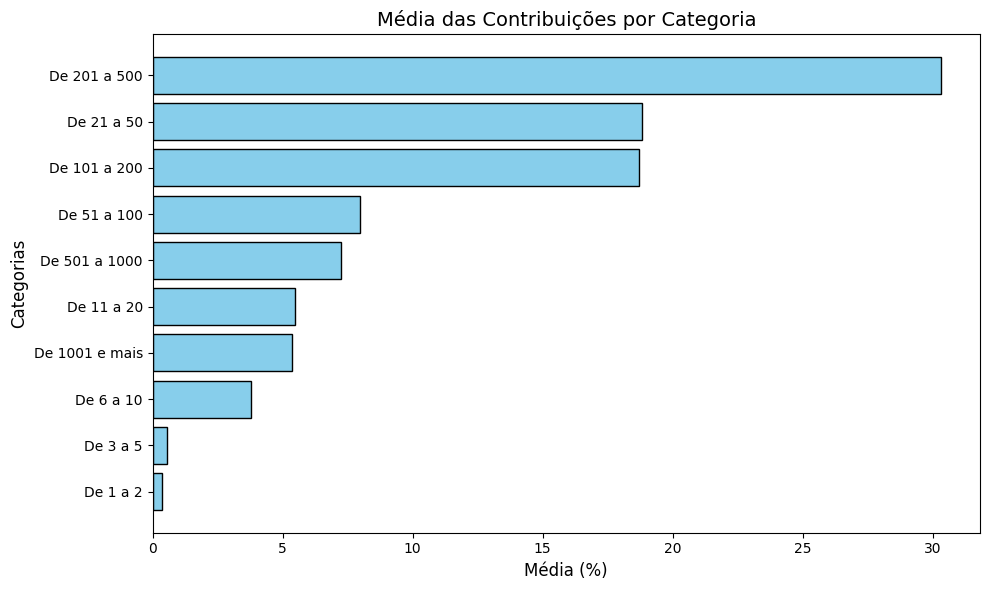

In [ ]:
# Dados das médias das categorias
medias = {
    0: 0.364,
    1: 0.554,
    2: 3.797,
    3: 5.461,
    4: 18.824,
    5: 7.987,
    6: 18.709,
    7: 30.301,
    8: 7.231,
    9: 5.345
}

# Nomes correspondentes às categorias
nomes_categorias = {
    0: "De 1 a 2",
    1: "De 3 a 5",
    2: "De 6 a 10",
    3: "De 11 a 20",
    4: "De 21 a 50",
    5: "De 51 a 100",
    6: "De 101 a 200",
    7: "De 201 a 500",
    8: "De 501 a 1000",
    9: "De 1001 e mais"
}

# Ordenar as categorias pela média (maior para menor)
categorias_ordenadas = sorted(medias.items(), key=lambda x: x[1], reverse=True)

# Extrair os dados para o gráfico
categorias = [nomes_categorias[cat[0]] for cat in categorias_ordenadas]
valores = [cat[1] for cat in categorias_ordenadas]

# Criar o gráfico de barras horizontais
plt.figure(figsize=(10, 6))
plt.barh(categorias, valores, color='skyblue', edgecolor='black')

# Configurar títulos e rótulos
plt.title('Média das Contribuições por Categoria', fontsize=14)
plt.xlabel('Média (%)', fontsize=12)
plt.ylabel('Categorias', fontsize=12)
plt.gca().invert_yaxis()  # Inverter o eixo Y para exibir a maior média no topo

# Exibir o gráfico
plt.tight_layout()
plt.show()


In [ ]:
def calcular_proporcoes_familiares_todas_cidades(df, lista_cidades):
    # Lista para armazenar os dados de todas as cidades
    proporcoes_dados = []

    for cidade in lista_cidades:
        # Filtrando os dados da cidade
        dados_cidade = df[df['Cidade'] == cidade]

        # Selecionando as categorias de quantidade de estabelecimentos
        categorias = df.columns[1:21:2]  # Total para cada faixa
        categorias_familiar = df.columns[21:41:2]  # Agricultura Familiar para cada faixa

        # Pegando os valores para total e familiar para cada faixa de vacas
        valores_totais = dados_cidade[categorias].values.flatten()
        valores_familiares = dados_cidade[categorias_familiar].values.flatten()

        # Nomes das categorias no eixo X
        labels = [col.replace("Total - ", "").replace("Agricultura familiar - Sim - ", "") for col in categorias]

        # Calculando a proporção de estabelecimentos de agricultura familiar
        proporcoes_familiares = (valores_familiares / valores_totais) * 100

        # Criando um dicionário para armazenar os dados de proporção da cidade atual
        proporcoes_dict = {'Cidade': cidade}
        for i, label in enumerate(labels):
            proporcoes_dict[label] = proporcoes_familiares[i]

        # Adicionando o dicionário à lista de dados
        proporcoes_dados.append(proporcoes_dict)

    # Convertendo a lista de dicionários para um DataFrame
    proporcoes_df = pd.DataFrame(proporcoes_dados)
    return proporcoes_df

# Exemplo de uso
# Substitua `df_estabelecimentos` pelo seu DataFrame e `lista_cidades` pela lista de cidades desejada
lista_cidades = top_10_distancias['Cidade']  # Exemplo de lista de cidades
proporcoes_df = calcular_proporcoes_familiares_todas_cidades(df_estabelecimentos, lista_cidades)

# Exibindo o DataFrame resultante
proporcoes_df.round(2)


<ipython-input-16-42343f06ec6d>:24: RuntimeWarning: invalid value encountered in divide
  proporcoes_familiares = (valores_familiares / valores_totais) * 100


,Cidade,De 1 a 2,De 3 a 5,De 6 a 10,De 11 a 20,De 21 a 50,De 51 a 100,De 101 a 200,De 201 a 500,De 501 a 1000,De 1001 e mais
0,Açailândia,0.00,100.00,88.89,88.64,88.41,86.98,65.47,41.24,8.33,0.00
1,Carolina,80.00,73.33,89.19,79.75,82.96,65.17,57.50,8.82,0.00,25.00
2,Grajaú,100.00,90.32,75.36,89.29,80.98,59.18,53.85,7.69,0.00,0.00
3,Riachão,100.00,93.33,88.89,84.78,83.33,80.49,56.00,27.27,0.00,0.00
4,Sítio Novo,100.00,100.00,93.59,93.50,86.11,76.34,66.67,50.00,0.00,0.00
5,São Francisco do Brejão,NaN,100.00,80.00,85.19,80.49,96.92,63.64,43.24,0.00,0.00
6,Cidelândia,100.00,100.00,88.89,95.00,92.81,90.80,74.58,21.21,0.00,14.29
7,Amarante do Maranhão,NaN,83.33,86.36,89.58,92.74,85.14,72.73,32.00,0.00,0.00
8,João Lisboa,100.00,100.00,83.33,91.18,87.50,84.21,62.50,34.62,22.22,0.00
9,Vitorino Freire,100.00,76.92,50.00,77.14,72.92,73.68,43.75,42.86,0.00,0.00


In [ ]:
proporcoes_df = proporcoes_df.fillna(0).mean(numeric_only=True).round(2).rename("Agricultura familiar")
proporcoes_df = proporcoes_df.apply(lambda x: f"{x:.2f}%")

# Exibe o DataFrame
proporcoes_df

,Agricultura familiar
De 1 a 2,67.53%
De 3 a 5,88.21%
De 6 a 10,84.10%
De 11 a 20,85.84%
De 21 a 50,85.33%
De 51 a 100,78.90%
De 101 a 200,58.05%
De 201 a 500,24.23%
De 501 a 1000,5.22%
De 1001 e mais,1.57%


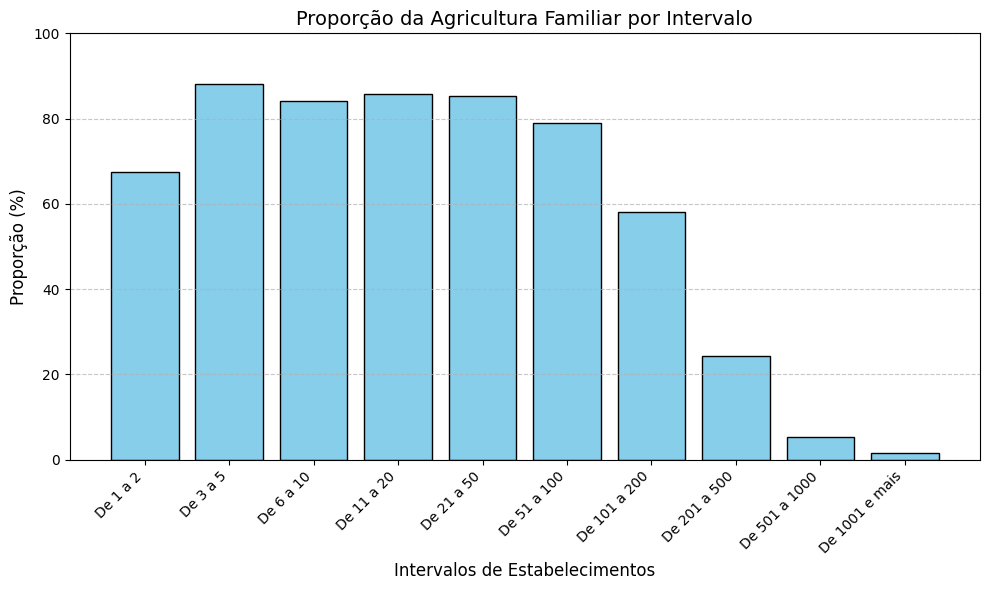

In [ ]:
# Dados da tabela
intervalos = [
    "De 1 a 2", "De 3 a 5", "De 6 a 10", "De 11 a 20",
    "De 21 a 50", "De 51 a 100", "De 101 a 200",
    "De 201 a 500", "De 501 a 1000", "De 1001 e mais"
]
valores = [67.53, 88.21, 84.10, 85.84, 85.33, 78.90, 58.05, 24.23, 5.22, 1.57]

# Criar o histograma
plt.figure(figsize=(10, 6))
plt.bar(intervalos, valores, color='skyblue', edgecolor='black')
plt.xticks(rotation=45, ha='right')
plt.title('Proporção da Agricultura Familiar por Intervalo', fontsize=14)
plt.xlabel('Intervalos de Estabelecimentos', fontsize=12)
plt.ylabel('Proporção (%)', fontsize=12)
plt.ylim(0, 100)  # Proporção varia de 0 a 100%
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Exibir o histograma
plt.tight_layout()
plt.show()


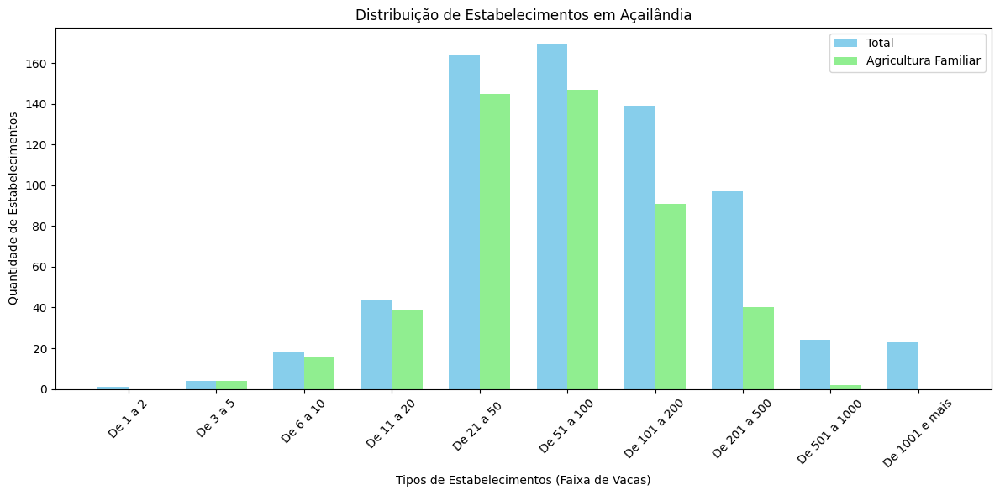

Faixa: De 1 a 2
  - Total: 1
  - Agricultura Familiar: 0
  - Diferença Absoluta: 1
  - Diferença Relativa: 100.00%
  - Proporção Familiar: 0.00%

Faixa: De 3 a 5
  - Total: 4
  - Agricultura Familiar: 4
  - Diferença Absoluta: 0
  - Diferença Relativa: 0.00%
  - Proporção Familiar: 100.00%

Faixa: De 6 a 10
  - Total: 18
  - Agricultura Familiar: 16
  - Diferença Absoluta: 2
  - Diferença Relativa: 11.11%
  - Proporção Familiar: 88.89%

Faixa: De 11 a 20
  - Total: 44
  - Agricultura Familiar: 39
  - Diferença Absoluta: 5
  - Diferença Relativa: 11.36%
  - Proporção Familiar: 88.64%

Faixa: De 21 a 50 
  - Total: 164
  - Agricultura Familiar: 145
  - Diferença Absoluta: 19
  - Diferença Relativa: 11.59%
  - Proporção Familiar: 88.41%

Faixa: De 51 a 100
  - Total: 169
  - Agricultura Familiar: 147
  - Diferença Absoluta: 22
  - Diferença Relativa: 13.02%
  - Proporção Familiar: 86.98%

Faixa: De 101 a 200
  - Total: 139
  - Agricultura Familiar: 91
  - Diferença Absoluta: 48
  - Difere

In [ ]:
# Função para criar um histograma combinado para cada cidade
def plot_histogram_combinado(df, cidade):
    # Filtrando os dados da cidade
    dados_cidade = df[df['Cidade'] == cidade]

    # Selecionando as categorias de quantidade de estabelecimentos
    categorias = df.columns[1:21:2]
    categorias_familiar = df.columns[21:41:2]

    # Pegando os valores para os histogramas
    valores_totais = dados_cidade[categorias].values.flatten()
    valores_familiares = dados_cidade[categorias_familiar].values.flatten()

    # Nomes das categorias no eixo X
    labels = [col.replace("Total - ", "").replace("Agricultura familiar - Sim - ", "") for col in categorias]

    # Configuração do gráfico
    x = np.arange(len(labels))  # Posições das barras no eixo X
    width = 0.35  # Largura das barras

    # Plotando o histograma combinado
    plt.figure(figsize=(12, 6))
    plt.bar(x - width/2, valores_totais, width, label='Total', color='skyblue')
    plt.bar(x + width/2, valores_familiares, width, label='Agricultura Familiar', color='lightgreen')

    plt.xlabel("Tipos de Estabelecimentos (Faixa de Vacas)")
    plt.ylabel("Quantidade de Estabelecimentos")
    plt.title(f"Distribuição de Estabelecimentos em {cidade}")
    plt.xticks(x, labels, rotation=45)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # Calculando a diferença absoluta e relativa para cada faixa de vacas
    diferencas_absolutas = valores_totais - valores_familiares
    diferencas_relativas = (diferencas_absolutas / valores_totais) * 100

    # Calculando a proporção de estabelecimentos de agricultura familiar
    proporcoes_familiares = (valores_familiares / valores_totais) * 100

    # Exibindo as análises
    for i, label in enumerate(labels):
        print(f"Faixa: {label}")
        print(f"  - Total: {valores_totais[i]}")
        print(f"  - Agricultura Familiar: {valores_familiares[i]}")
        print(f"  - Diferença Absoluta: {diferencas_absolutas[i]}")
        print(f"  - Diferença Relativa: {diferencas_relativas[i]:.2f}%")
        print(f"  - Proporção Familiar: {proporcoes_familiares[i]:.2f}%")
        print()


# Exemplo: Plotando para a cidade "Açailândia"
plot_histogram_combinado(df_estabelecimentos, "Açailândia")


In [ ]:
# Função para extrair a faixa de vacas da moda, ignorando o prefixo
def extrair_faixa(moda):
    # Remove o prefixo "Total - " ou "Agricultura familiar - Sim - "
    return moda.replace("Total - ", "").replace("Agricultura familiar - Sim - ", "")

# Aplicando a função para extrair a faixa de vacas
df_estabelecimentos['Faixa Moda Estabelecimentos'] = df_estabelecimentos['Moda Estabelecimentos'].apply(extrair_faixa)
df_estabelecimentos['Faixa Moda Pequenos Produtores'] = df_estabelecimentos['Moda Pequenos Produtores'].apply(extrair_faixa)

# Comparando as faixas de vacas
df_estabelecimentos['Concordância Moda'] = (
    df_estabelecimentos['Faixa Moda Estabelecimentos'] == df_estabelecimentos['Faixa Moda Pequenos Produtores']
)

# Calculando a proporção de municípios com concordância e discordância
proporcao_concordancia = df_estabelecimentos['Concordância Moda'].mean()
proporcao_discordancia = 1 - proporcao_concordancia

# Calculando a quantidade de municípios com concordância e discordância
qtd_concordancia = df_estabelecimentos['Concordância Moda'].sum()
qtd_discordancia = len(df_estabelecimentos) - qtd_concordancia

# Exibindo os resultados
print(f"Proporção de Concordância: {proporcao_concordancia:.2%}")
print(f"Proporção de Discordância: {proporcao_discordancia:.2%}")
print(f"Quantidade de Municípios com Concordância: {qtd_concordancia}")
print(f"Quantidade de Municípios com Discordância: {qtd_discordancia}")

# Analisando estatísticas descritivas para as quantidades de estabelecimentos em cada categoria
# Selecionando as colunas de quantidade de estabelecimentos para o contexto geral e pequenos produtores
categorias_quantidade = df_estabelecimentos.columns[1:21:2]  # Quantidades totais de estabelecimentos
categorias_familiar = df_estabelecimentos.columns[21:41:2]   # Quantidades de pequenos produtores

# Calculando estatísticas descritivas
estatisticas_geral = df_estabelecimentos[categorias_quantidade].describe()
estatisticas_familiar = df_estabelecimentos[categorias_familiar].describe()

print("\nEstatísticas Descritivas - Estabelecimentos Gerais")
print(estatisticas_geral)

print("\nEstatísticas Descritivas - Pequenos Produtores")
print(estatisticas_familiar)


Proporção de Concordância: 86.73%
Proporção de Discordância: 13.27%
Quantidade de Municípios com Concordância: 170
Quantidade de Municípios com Discordância: 26

Estatísticas Descritivas - Estabelecimentos Gerais
       Total - De 1 a 2  Total - De 3 a 5  Total - De 6 a 10  \
count        196.000000        196.000000         196.000000   
mean           0.755102          3.275510           8.877551   
std            1.224211          4.772315          11.815041   
min            0.000000          0.000000           0.000000   
25%            0.000000          0.000000           1.750000   
50%            0.000000          2.000000           5.000000   
75%            1.000000          4.000000          12.000000   
max            8.000000         31.000000          78.000000   

       Total - De 11 a 20  Total - De 21 a 50   Total - De 51 a 100  \
count          196.000000           196.000000           196.000000   
mean            15.433673            27.897959            15.056122 

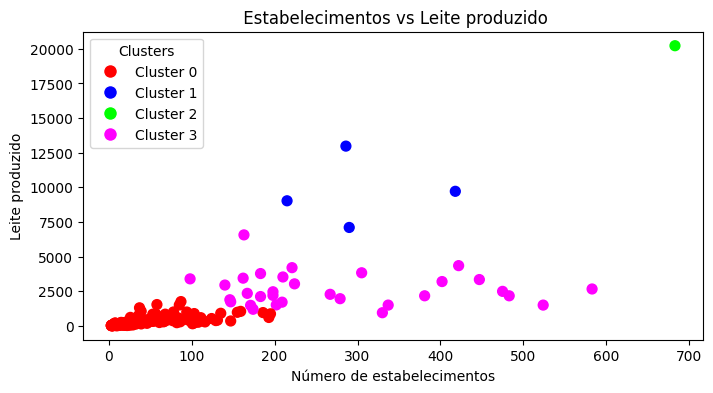

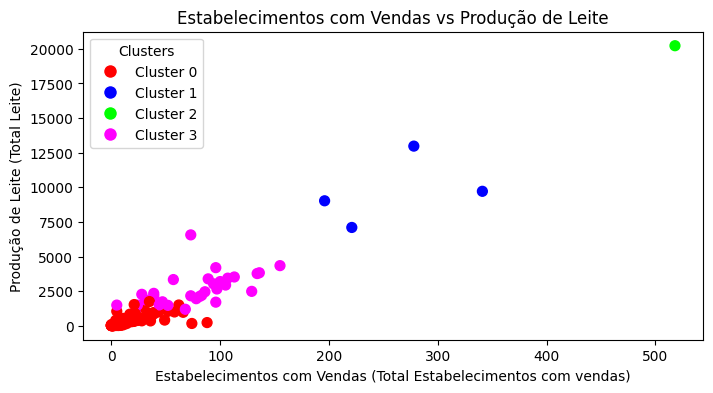

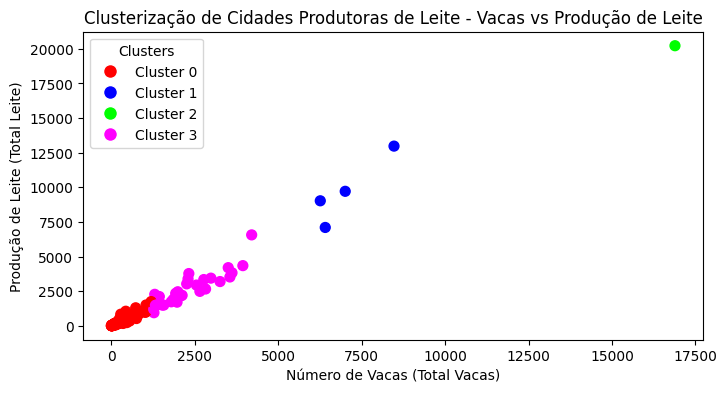

        Total Vacas               Total Leite                \
                sum          mean         sum          mean   
cluster                                                       
0             42649    269.930380    47216.24    298.836962   
1             28156   7039.000000    38820.34   9705.085000   
2             16886  16886.000000    20227.38  20227.380000   
3             71598   2309.612903    81840.90   2640.029032   

        Total Valor produção               Total Estabelecimentos com vendas  \
                         sum          mean                               sum   
cluster                                                                        
0                   77732.01    491.974747                              2104   
1                   34054.14   8513.535000                              1036   
2                   18374.10  18374.100000                               518   
3                  105999.47   3419.337742                              2381  

In [ ]:
# Calcular porcentagem de estabelecimentos em agricultura familiar e não familiar
df['Proporção Agricultura Familiar'] = df['Total - Agricultura familiar - Sim'] / df['Total']
df['Proporção Agricultura Não Familiar'] = df['Total - Agricultura familiar - Não'] / df['Total']
df['Proporção Pronaf V'] = df['Total - Pronaf V'] / df['Total - Agricultura familiar - Sim']

# Selecionar variáveis para clusterização
data = df[[
    'Total',
    'Total Vacas',
    'Total Leite',
    'Total Valor produção',
    'Total Estabelecimentos com vendas',
    'Total Quantidade vendida',
    'Total  Valor de venda',
    #'Agricultura familiar - Sim - Proprietário(a) - De 1001 e mais'
]]

# Normalizar os dados
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Aplicação do K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
df['cluster'] = kmeans.fit_predict(data_scaled)

cluster_colors = {0: '#FF0000', 1: '#0000FF', 2: '#00FF00', 3: '#FF00FF'}

colors = df['cluster'].map(cluster_colors)

# Estabelecimentos vs Leite produzido
plt.figure(figsize=(8, 4))
plt.scatter(df['Total'],
            df['Total Leite'],
            c=colors, s=50)
plt.xlabel('Número de estabelecimentos')
plt.ylabel('Leite produzido')
plt.title(' Estabelecimentos vs Leite produzido')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
           for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title='Clusters')

plt.show()


# Estabelecimentos com Vendas vs Produção de Leite
plt.figure(figsize=(8, 4))
plt.scatter(df['Total Estabelecimentos com vendas'],
            df['Total Leite'],
            c=colors, s=50)
plt.xlabel('Estabelecimentos com Vendas (Total Estabelecimentos com vendas)')
plt.ylabel('Produção de Leite (Total Leite)')
plt.title('Estabelecimentos com Vendas vs Produção de Leite')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
           for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title='Clusters')

plt.show()

# Vacas vs Produção de Leite
plt.figure(figsize=(8, 4))
plt.scatter(df['Total Vacas'],
            df['Total Leite'],
            c=colors, s=50)
plt.xlabel('Número de Vacas (Total Vacas)')
plt.ylabel('Produção de Leite (Total Leite)')
plt.title('Clusterização de Cidades Produtoras de Leite - Vacas vs Produção de Leite')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
           for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title='Clusters')

plt.show()

numeric_cols = df.select_dtypes(include=['number']).columns
cluster_summary = df[numeric_cols].groupby(df['cluster']).agg(['sum', 'mean'])

print(cluster_summary)



In [ ]:
# Arredondar as colunas especificadas para duas casas decimais

cluster_summary[['Total Vacas', 'Total Leite', 'Total Quantidade vendida', 'Total Valor produção', 'Total  Valor de venda', 'Total', 'Total Estabelecimentos com vendas']].round(2)




Total Vacas           Total Leite           Total Quantidade vendida  \
                sum      mean         sum      mean                      sum   
cluster                                                                        
0             42649    269.93    47216.24    298.84                 24221.07   
1             28156   7039.00    38820.34   9705.08                 36208.86   
2             16886  16886.00    20227.38  20227.38                 16773.06   
3             71598   2309.61    81840.90   2640.03                 45672.26   

                  Total Valor produção           Total  Valor de venda  \
             mean                  sum      mean                   sum   
cluster                                                                  
0          153.30             77732.01    491.97              37759.11   
1         9052.22             34054.14   8513.54              31774.84   
2        16773.06             18374.10  18374.10              15291.64   
3         1473.30            105999.47   3419.34              53094.60   

                  Total         Total Estabelecimentos com vendas          
             mean   sum    mean                               sum    mean  
cluster                                                                    
0          238.98  6814   43.13                              2104   13.32  
1         7943.71  1209  302.25                              1036  259.00  
2        15291.64   683  683.00                               518  518.00  
3         1712.73  8431  271.97                              2381   76.81

In [ ]:
cluster_summary[[ 'F Vacas',
                 'F Leite', 'F Quantidade vendida', 'F Valor produção', 'F  Valor de venda',  'Total - Agricultura familiar - Sim', 'F Estabelecimentos com vendas']].round(2)

F Vacas            F Leite           F Quantidade vendida           \
            sum     mean       sum      mean                  sum     mean   
cluster                                                                      
0         28118   177.96  29782.25    188.50             14167.88    89.67   
1         15951  3987.75  21960.34   5490.08             20210.92  5052.73   
2          9934  9934.00  12117.52  12117.52              9839.49  9839.49   
3         47463  1531.06  53291.85   1719.09             26738.08   862.52   

        F Valor produção           F  Valor de venda           \
                     sum      mean               sum     mean   
cluster                                                         
0               51116.70    323.52          23140.60   146.46   
1               19169.49   4792.37          17651.53  4412.88   
2               11031.27  11031.27           9003.41  9003.41   
3               71246.42   2298.27          32247.75  1040.25   

        Total - Agricultura familiar - Sim          \
                                       sum    mean   
cluster                                              
0                                     5394   34.14   
1                                      912  228.00   
2                                      484  484.00   
3                                     6640  214.19   

        F Estabelecimentos com vendas          
                                  sum    mean  
cluster                                        
0                                1586   10.04  
1                                 782  195.50  
2                                 370  370.00  
3                                1819   58.68

In [ ]:
cluster_summary['Proporção FAMILIAR/Total Leite'] = (
    cluster_summary[('F Leite', 'sum')] / cluster_summary[('Total Leite', 'sum')]
)

<ipython-input-24-1c2cab788c4c>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cluster_summary['Proporção FAMILIAR/Total Leite'] = (


In [ ]:
cluster_summary['Proporção FAMILIAR/Total Leite'].round(2)

,Proporção FAMILIAR/Total Leite
cluster,
0,0.63
1,0.57
2,0.60
3,0.65


In [ ]:
# 1. Representatividade da Agricultura Familiar
cluster_summary['Proporção FAMILIAR/Total Vacas'] = cluster_summary['F Vacas', 'sum'] / cluster_summary['Total Vacas', 'sum']
cluster_summary['Proporção FAMILIAR/Total Leite'] = cluster_summary['F Leite', 'sum'] / cluster_summary['Total Leite', 'sum']
cluster_summary['Proporção FAMILIAR/Total Quantidade vendida'] = cluster_summary['F Quantidade vendida', 'sum'] / cluster_summary['Total Quantidade vendida', 'sum']
cluster_summary['Proporção FAMILIAR/Total Valor produção'] = cluster_summary['F Valor produção', 'sum'] / cluster_summary['Total Valor produção', 'sum']
cluster_summary['Proporção FAMILIAR/Total Valor de venda'] = cluster_summary['F  Valor de venda', 'sum'] / cluster_summary['Total  Valor de venda', 'sum']

# 2. Produtividade Relativa
cluster_summary['Proporção Estabelecimentos Familiares'] = cluster_summary['F Estabelecimentos com vendas', 'sum'] / cluster_summary['Total Estabelecimentos com vendas', 'sum']

# Potencial de venda alcançado
cluster_summary['Potencial Econômico Familiar'] = cluster_summary['F  Valor de venda', 'sum'] / cluster_summary['F Leite', 'sum']
cluster_summary['Potencial Econômico Total'] = cluster_summary['Total  Valor de venda', 'sum'] / cluster_summary['Total Leite', 'sum']


# Exibir o DataFrame atualizado
#import ace_tools as tools; tools.display_dataframe_to_user(name="Cluster Summary com Análises de Agricultura Familiar", dataframe=cluster_summary)


<ipython-input-26-89da12436dec>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cluster_summary['Proporção FAMILIAR/Total Vacas'] = cluster_summary['F Vacas', 'sum'] / cluster_summary['Total Vacas', 'sum']
<ipython-input-26-89da12436dec>:6: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cluster_summary['Proporção FAMILIAR/Total Quantidade vendida'] = cluster_summary['F Quantidade vendida', 'sum'] / cluster_summary['Total Quantidade vendida', 'sum']
<ipython-input-26-89da12436dec>:7: PerformanceWarning: DataFrame is highly fragme

In [ ]:
cluster_summary[['Proporção FAMILIAR/Total Vacas', 'Proporção FAMILIAR/Total Leite', 'Proporção FAMILIAR/Total Quantidade vendida', 'Proporção FAMILIAR/Total Valor produção', 'Proporção FAMILIAR/Total Valor de venda']].round(2)


,Proporção FAMILIAR/Total Vacas,Proporção FAMILIAR/Total Leite,Proporção FAMILIAR/Total Quantidade vendida,Proporção FAMILIAR/Total Valor produção,Proporção FAMILIAR/Total Valor de venda
,,,,,
cluster,,,,,
0,0.66,0.63,0.58,0.66,0.61
1,0.57,0.57,0.56,0.56,0.56
2,0.59,0.60,0.59,0.60,0.59
3,0.66,0.65,0.59,0.67,0.61


In [ ]:
cluster_summary['Proporção Estabelecimentos Familiares'].round(2)

,Proporção Estabelecimentos Familiares
cluster,
0,0.75
1,0.75
2,0.71
3,0.76


In [ ]:
cluster_summary[['Potencial Econômico Familiar', 'Potencial Econômico Total']].round(2)

,Potencial Econômico Familiar,Potencial Econômico Total
,,
cluster,,
0,0.78,0.80
1,0.80,0.82
2,0.74,0.76
3,0.61,0.65


In [ ]:
# Carregar o arquivo geojson dos municípios
with open('geojs-21-mun.json') as f:
    geo_data = json.load(f)

# Criar o dicionário de proporções
familiar_dict = pd.Series(df['cluster'].values, index=df['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['familiar'] = familiar_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
cluster_colors = {0: '#FF0000', 1: '#0000FF', 2: '#00FF00', 3: '#FF00FF', 'N/A': '#000000'}

def get_style(feature):
    return {
        'fillColor': cluster_colors[feature['properties']["familiar"]],
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 1
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "familiar"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Cluster: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m

#DBScan


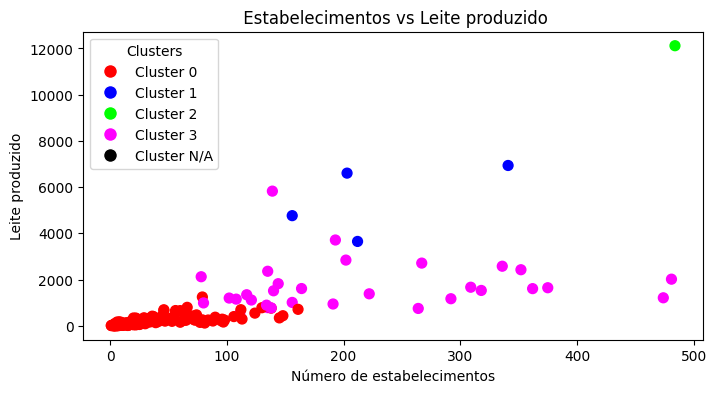

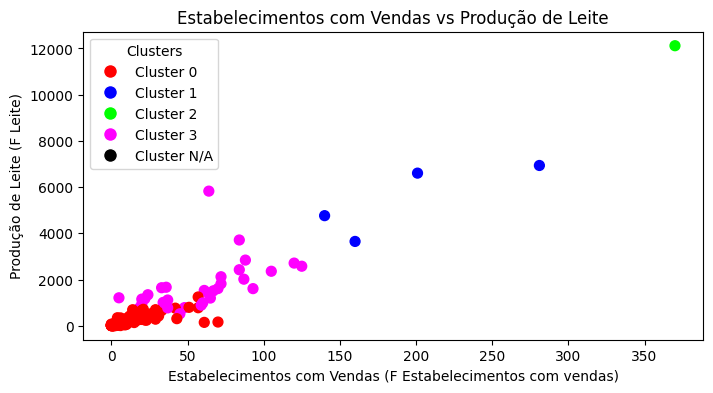

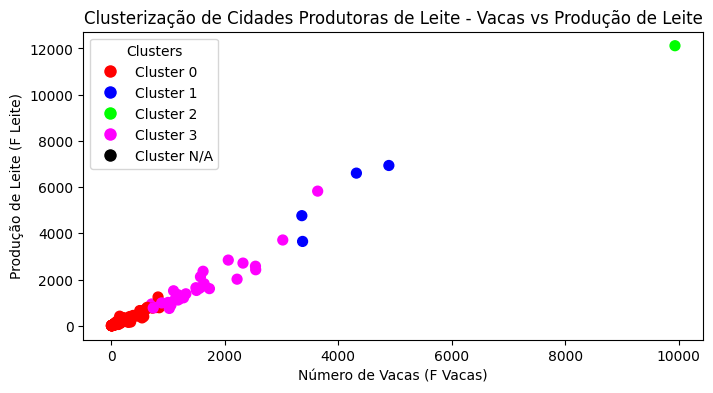

        Total Vacas               Total Leite                \
                sum          mean         sum          mean   
cluster                                                       
0             34793    235.087838    38853.21    262.521689   
1             62936   3933.500000    78299.16   4893.697500   
2             16886  16886.000000    20227.38  20227.380000   
3             44674   1540.482759    50725.11   1749.141724   

        Total Valor produção               Total Estabelecimentos com vendas  \
                         sum          mean                               sum   
cluster                                                                        
0                   65466.86    442.343649                              1652   
1                   88887.90   5555.493750                              2090   
2                   18374.10  18374.100000                               518   
3                   63430.86   2187.271034                              1779  

In [ ]:
# Selecionar variáveis para clusterização
data = df[[
    'Total - Agricultura familiar - Sim',
    'F Vacas',
    'F Leite',
    'F Valor produção',
    'F Estabelecimentos com vendas',
]]

# Normalizar os dados
scaler = StandardScaler()
data_scaled = scaler.fit_transform(data)

# Aplicação do K-Means
kmeans = KMeans(n_clusters=4, random_state=42)
df['cluster'] = kmeans.fit_predict(data_scaled)

# Estabelecimentos vs Leite produzido
plt.figure(figsize=(8, 4))
plt.scatter(df['Total - Agricultura familiar - Sim'],
            df['F Leite'],
            c=colors, s=50)
plt.xlabel('Número de estabelecimentos')
plt.ylabel('Leite produzido')
plt.title(' Estabelecimentos vs Leite produzido')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
           for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title='Clusters')

plt.show()


# Estabelecimentos com Vendas vs Produção de Leite
plt.figure(figsize=(8, 4))
plt.scatter(df['F Estabelecimentos com vendas'],
            df['F Leite'],
            c=colors, s=50)
plt.xlabel('Estabelecimentos com Vendas (F Estabelecimentos com vendas)')
plt.ylabel('Produção de Leite (F Leite)')
plt.title('Estabelecimentos com Vendas vs Produção de Leite')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
           for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title='Clusters')

plt.show()

# Vacas vs Produção de Leite
plt.figure(figsize=(8, 4))
plt.scatter(df['F Vacas'],
            df['F Leite'],
            c=colors, s=50)
plt.xlabel('Número de Vacas (F Vacas)')
plt.ylabel('Produção de Leite (F Leite)')
plt.title('Clusterização de Cidades Produtoras de Leite - Vacas vs Produção de Leite')

handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=color, markersize=10)
           for color in cluster_colors.values()]
labels = [f'Cluster {i}' for i in cluster_colors.keys()]
plt.legend(handles, labels, title='Clusters')

plt.show()

numeric_cols = df.select_dtypes(include=['number']).columns
cluster_summary = df[numeric_cols].groupby(df['cluster']).agg(['sum', 'mean'])

print(cluster_summary)



In [ ]:
cluster_summary[[ 'F Vacas',
                 'F Leite', 'F Quantidade vendida', 'F Valor produção', 'F  Valor de venda',  'Total - Agricultura familiar - Sim', 'F Estabelecimentos com vendas']].round(2)



F Vacas            F Leite           F Quantidade vendida           \
            sum     mean       sum      mean                  sum     mean   
cluster                                                                      
0         21993   148.60  23278.44    157.29             10804.32    73.00   
1         41909  2619.31  51756.58   3234.79             33070.46  2066.90   
2          9934  9934.00  12117.52  12117.52              9839.49  9839.49   
3         27630   952.76  29999.42   1034.46             17242.10   594.56   

        F Valor produção           F  Valor de venda           \
                     sum      mean               sum     mean   
cluster                                                         
0               41499.29    280.40          18817.77   127.15   
1               60414.83   3775.93          33840.04  2115.00   
2               11031.27  11031.27           9003.41  9003.41   
3               39618.49   1366.15          20382.07   702.83   

        Total - Agricultura familiar - Sim          \
                                       sum    mean   
cluster                                              
0                                     4194   28.34   
1                                     4720  295.00   
2                                      484  484.00   
3                                     4032  139.03   

        F Estabelecimentos com vendas          
                                  sum    mean  
cluster                                        
0                                1202    8.12  
1                                1662  103.88  
2                                 370  370.00  
3                                1323   45.62

In [ ]:
cluster_summary['Proporção Estabelecimentos Familiares com Vendas'] = cluster_summary['F Estabelecimentos com vendas', 'sum'] / cluster_summary['Total Estabelecimentos com vendas', 'sum']

<ipython-input-33-978c8132e1ce>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cluster_summary['Proporção Estabelecimentos Familiares com Vendas'] = cluster_summary['F Estabelecimentos com vendas', 'sum'] / cluster_summary['Total Estabelecimentos com vendas', 'sum']


In [ ]:
cluster_summary['Proporção Estabelecimentos Familiares Geral']= cluster_summary['Total - Agricultura familiar - Sim', 'sum'] / cluster_summary['Total', 'sum']

<ipython-input-34-0bbaf4e175f7>:1: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  cluster_summary['Proporção Estabelecimentos Familiares Geral']= cluster_summary['Total - Agricultura familiar - Sim', 'sum'] / cluster_summary['Total', 'sum']


In [ ]:
cluster_summary['Proporção Estabelecimentos Familiares com Vendas'].round(2)

,Proporção Estabelecimentos Familiares com Vendas
cluster,
0,0.73
1,0.80
2,0.71
3,0.74


In [ ]:
cluster_summary['Proporção Estabelecimentos Familiares Geral']

,Proporção Estabelecimentos Familiares Geral
cluster,
0,0.779554
1,0.808358
2,0.708638
3,0.770201


In [ ]:
cluster_summary['Total']

,sum,mean
cluster,,
0,5380,36.351351
1,5839,364.937500
2,683,683.000000
3,5235,180.517241


In [ ]:
# Carregar o arquivo geojson dos municípios
with open('geojs-21-mun.json') as f:
    geo_data = json.load(f)

# Criar o dicionário de proporções
familiar_dict = pd.Series(df['cluster'].values, index=df['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['familiar'] = familiar_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
# cluster_colors = {0: '#FF0000', 1: '#0000FF', 2: '#00FF00', 3: '#FF00FF', 'N/A': '#000000'}
cluster_colors = {2: '#231942', 3: '#5e548e', 1: '#9f86c0', 0: '#be95c4', 'N/A': '#000000'}

def get_style(feature):
    return {
        'fillColor': cluster_colors[feature['properties']["familiar"]],
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 1
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "familiar"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Cluster: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m

#DBScan


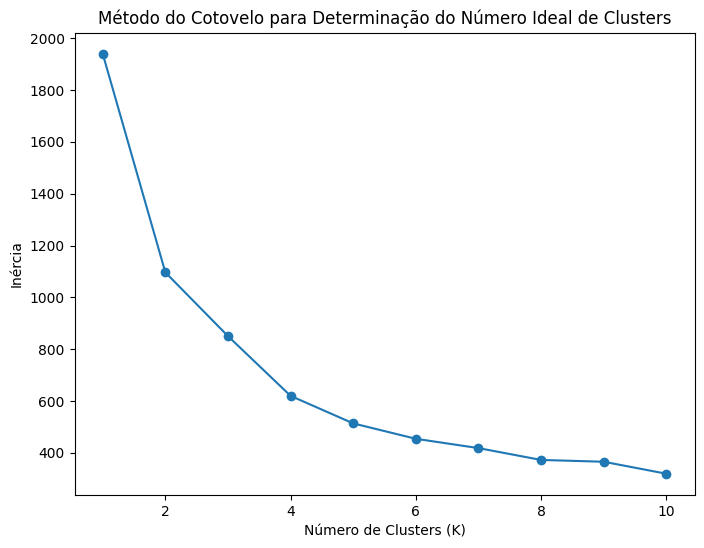

In [ ]:
# Selecionar apenas as colunas de quantidade de vacas em cada faixa para normalização
quantidades_vacas = df[['Total - De 1 a 2', 'Total - De 3 a 5', 'Total - De 6 a 10',
                        'Total - De 11 a 20', 'Total - De 21 a 50 ', 'Total - De 51 a 100',
                        'Total - De 101 a 200', 'Total - De 201 a 500',
                        'Total - De 501 a 1000', 'Total - De 1001 e mais']]

# Normalizar os dados
scaler = StandardScaler()
quantidades_vacas_scaled = scaler.fit_transform(quantidades_vacas)

# Calcular a inércia para diferentes valores de K
inercia = []
K_range = range(1, 11)  # Tente de 1 a 10 clusters, ajuste o intervalo conforme necessário
for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(quantidades_vacas_scaled)
    inercia.append(kmeans.inertia_)

# Plotar o gráfico do cotovelo
plt.figure(figsize=(8, 6))
plt.plot(K_range, inercia, marker='o', linestyle='-')
plt.xlabel('Número de Clusters (K)')
plt.ylabel('Inércia')
plt.title('Método do Cotovelo para Determinação do Número Ideal de Clusters')
plt.show()


In [ ]:
# Normalizar os dados para a clusterização
scaler = StandardScaler()
quantidades_vacas_scaled = scaler.fit_transform(quantidades_vacas)

# Definir o número de clusters desejado
kmeans = KMeans(n_clusters=4, random_state=42)
df['cluster_kmeans'] = kmeans.fit_predict(quantidades_vacas_scaled)

# Criar o dicionário de proporções
quantidades_vacas_dict = pd.Series(df['cluster_kmeans'].values, index=df['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['qtd_vacas'] = quantidades_vacas_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
cluster_colors = {2: '#231942', 3: '#5e548e', 1: '#9f86c0', 0: '#be95c4', 'N/A': '#000000'}

def get_style(feature):
    return {
        'fillColor': cluster_colors[feature['properties']["qtd_vacas"]],
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 1
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "qtd_vacas"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Cluster: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m


In [ ]:
# Selecionar as colunas que começam com 'Total - De'
vacas_cols = [col for col in df.columns if col.startswith('Total - De')]

# Calcular a média das colunas filtradas por cluster
cluster_summary = df[vacas_cols + ['cluster_kmeans']].groupby('cluster_kmeans').mean()

# Exibir o resumo
print(cluster_summary)

#0: Vermelho
# <10 em quase todos
# Concentração na faixa de 11 - 50
#1: Azul
# Mais na faixa de 11 - 50 | < 100
#2: Verde
# De 21 a 200 | < 170 - único alto nas duas últimas
#3: Roxo
# Boa quantidade em quase todos - faixa 6 a 100
#4: Laranja
# Sempre melhor que o vermelho - mas não tão bom


                Total - De 1 a 2  Total - De 3 a 5  Total - De 6 a 10  \
cluster_kmeans                                                          
0                       0.503185          2.242038           5.770701   
1                       1.142857          4.678571          14.392857   
2                       1.000000          4.000000          18.000000   
3                       4.500000         19.375000          51.500000   

                Total - De 11 a 20  Total - De 21 a 50   Total - De 51 a 100  \
cluster_kmeans                                                                 
0                         8.535032            12.700637             6.082803   
1                        33.964286            76.642857            44.964286   
2                        44.000000           164.000000           169.000000   
3                        86.125000           145.375000            71.000000   

                Total - De 101 a 200  Total - De 201 a 500  \
cluster_kmeans    

In [ ]:
# Criar o dicionário de proporções
familiar_dict = pd.Series(df['Proporção Agricultura Familiar'].values, index=df['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['familiar'] = familiar_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
def get_style(feature):
    return {
        'fillColor': '#FFFFFF',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Criar a camada Choropleth
choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df,
    columns=["Cidade", "Proporção Agricultura Familiar"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Proporção Agricultura Familiar',
    highlight=True
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "familiar"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Proporção Agricultura Familiar: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m


In [ ]:
# Criar o dicionário de proporções
pronaf_dict = pd.Series(df['Proporção Pronaf V'].values, index=df['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['pronaf'] = pronaf_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
def get_style(feature):
    return {
        'fillColor': '#FFFFFF',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

# Criar a camada Choropleth
choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df,
    columns=["Cidade", "Proporção Pronaf V"],
    key_on='feature.properties.name',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Pronaf V',
    highlight=True
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "pronaf"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Proporção Pronaf V: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m


In [ ]:
# Criar o dicionário de proporções
estabelecimentos_vendas_dict = pd.Series(df['Total Estabelecimentos com vendas'].values, index=df['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['estabelecimentos_vendas'] = estabelecimentos_vendas_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
def get_style(feature):
    return {
        'fillColor': '#FFFFFF',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    }

# Criar o mapa base
m = folium.Map(location=[-7, -45], zoom_start=6)

df['Total Estabelecimentos com vendas (log)'] = np.log1p(df['Total Estabelecimentos com vendas'])

# Criar o mapa usando a coluna transformada
choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df,
    columns=["Cidade", "Total Estabelecimentos com vendas (log)"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Logaritmo do Total Estabelecimentos com vendas'
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "estabelecimentos_vendas"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Estabelecimentos com vendas: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Exibir o mapa
m


In [ ]:
# Renomear colunas para combinar com as de origem e destino
df_coords_origem = df_coords[['municipio', 'uf', 'latitude', 'longitude']].rename(
    columns={'municipio': 'NOME_ORIGEM', 'uf': 'UF_ORIGEM', 'latitude': 'latitude_ori', 'longitude': 'longitude_ori'}
)
df_coords_destino = df_coords[['municipio', 'uf', 'latitude', 'longitude']].rename(
    columns={'municipio': 'NOME_DESTINO', 'uf': 'UF_DESTINO', 'latitude': 'latitude_dest', 'longitude': 'longitude_dest'}
)

# Merge com as coordenadas de origem e destino
df_merged = pd.merge(df_fluxos_destino, df_coords_origem, on=['NOME_ORIGEM', 'UF_ORIGEM'], how='left')
df_merged = pd.merge(df_merged, df_coords_destino, on=['NOME_DESTINO', 'UF_DESTINO'], how='left')

# Remover linhas com valores NaN nas coordenadas de origem ou destino
df_filtered = df_merged.dropna(subset=['latitude_ori', 'longitude_ori', 'latitude_dest', 'longitude_dest'])
# Parâmetro de distância do buffer em metros (ajuste conforme necessário)

# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df,
    columns=["Cidade", "Total Estabelecimentos com vendas (log)"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Estabelecimentos com vendas',
    highlight=True
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "estabelecimentos_vendas"],  # Agora usamos 'name' e 'pronaf' do GeoJSON
        aliases=["Município: ", "Estabelecimentos com vendas: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Adicionar as conexões entre cidades de origem e destino com a espessura baseada em PERCENTUAL
for idx, row in df_filtered.iterrows():
    origem = [row['latitude_ori'], row['longitude_ori']]
    destino = [row['latitude_dest'], row['longitude_dest']]

    # Adicionar buffer ao redor das cidades de origem
    folium.CircleMarker(
        location=origem,
        radius=3,  # Raio do buffer em metros
        #color='red',
        fill=True,
        #fill_color='red',
        color = 'red',
        fill_color = 'red',
        fill_opacity=0.2,
        tooltip=row['NOME_ORIGEM']
    ).add_to(m)

    # Adicionar linha para cada conexão, com grossura baseada no percentual
    folium.PolyLine(
        locations=[origem, destino],
        #weight=row['PERCENTUAL'] / 5,  # Ajuste o divisor para controlar a espessura
        weight= 3.5,
        color='green',
        opacity=0.6,
        tooltip=row['PERCENTUAL']
    ).add_to(m)

    folium.CircleMarker(
        location=destino,
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=row['NOME_DESTINO']
    ).add_to(m)

m.save("meu_mapa.html")
# Exibir o mapa no Colab (para visualização imediata)
m


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Carregar a aba "Destino da produção" do arquivo Excel
df_fluxos_insumos = pd.read_excel('Fluxos.xlsx', sheet_name='Insumo')

# Filtrar onde UF_ORIGEM é MA e PRODUTO é "Leite"
df_fluxos_insumos = df_fluxos_insumos[(df_fluxos_insumos['UF_ORIGEM'] == 'MA') & (df_fluxos_insumos['PRODUTO'] == 'Leite')]

In [ ]:
df_merged = pd.merge(df_fluxos_insumos, df_coords_origem, on=['NOME_ORIGEM', 'UF_ORIGEM'], how='left')
df_merged = pd.merge(df_merged, df_coords_destino, on=['NOME_DESTINO', 'UF_DESTINO'], how='left')

# Remover linhas com valores NaN nas coordenadas de origem ou destino
df_filtered = df_merged.dropna(subset=['latitude_ori', 'longitude_ori', 'latitude_dest', 'longitude_dest'])

# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Adicionar as conexões entre cidades de origem e destino com a espessura baseada em PERCENTUAL
for idx, row in df_filtered.iterrows():
    origem = [row['latitude_ori'], row['longitude_ori']]
    destino = [row['latitude_dest'], row['longitude_dest']]

    # Adicionar linha para cada conexão, com grossura baseada no percentual
    folium.PolyLine(
        locations=[origem, destino],
        weight=row['PERCENTUAL'] / 10,  # Ajuste o divisor para controlar a espessura
        color='green',
        opacity=0.6
    ).add_to(m)

# Adicionar marcadores para as cidades de destino com uma cor diferente e nome

    folium.RegularPolygonMarker(
      location=destino,
      number_of_sides=4,  # Use 4 para quadrado
      radius=8,
      color='red',
      tooltip=row['NOME_DESTINO']
    ).add_to(m)

    #Nessa caso o destino é de onde tá saindo

    folium.CircleMarker(
        location=origem,
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=row['NOME_ORIGEM']
    ).add_to(m)

# Exibir o mapa no Colab (para visualização imediata)
m

In [ ]:
leite_dict = pd.Series(df['Total Leite'].values, index=df['Cidade']).to_dict()

# Adicionar o campo da proporção no geojson
for feature in geo_data['features']:
    municipio = feature['properties']['name']
    feature['properties']['cidades_leite'] = leite_dict.get(municipio, 'N/A')  # Adiciona a proporção ao GeoJSON

# Função para definir o estilo
def get_style(feature):
    return {
        'fillColor': '#FFFFFF',
        'color': 'black',
        'weight': 0.5,
        'fillOpacity': 0
    }

df['Total Leite (log)'] = np.log1p(df['Total Leite'])

# Merge com as coordenadas de origem e destino
df_merged = pd.merge(df_fluxos_insumos, df_coords_origem, on=['NOME_ORIGEM', 'UF_ORIGEM'], how='left')
df_merged = pd.merge(df_merged, df_coords_destino, on=['NOME_DESTINO', 'UF_DESTINO'], how='left')

# Remover linhas com valores NaN nas coordenadas de origem ou destino
df_filtered = df_merged.dropna(subset=['latitude_ori', 'longitude_ori', 'latitude_dest', 'longitude_dest'])

# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

choropleth = folium.Choropleth(
    geo_data=geo_data,
    name='choropleth',
    data=df,
    columns=["Cidade", "Total Leite (log)"],
    key_on='feature.properties.name',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Total Leite',
    highlight=True
).add_to(m)

# Adicionar o GeoJson com o tooltip personalizado
folium.GeoJson(
    geo_data,
    style_function=get_style,  # Aplica o estilo
    tooltip=folium.GeoJsonTooltip(
        fields=["name", "cidades_leite"],
        aliases=["Município: ", "Produção de Leite: "],  # Legendas para os campos
        localize=True
    )
).add_to(m)

# Adicionar as conexões entre cidades de origem e destino com a espessura baseada em PERCENTUAL
for idx, row in df_filtered.iterrows():
    origem = [row['latitude_ori'], row['longitude_ori']]
    destino = [row['latitude_dest'], row['longitude_dest']]

    # Adicionar buffer ao redor das cidades de origem
    folium.CircleMarker(
        location=origem,
        radius=3,  # Raio do buffer em metros
        #color='red',
        fill=True,
        #fill_color='red',
        color = 'red',
        fill_color = 'red',
        fill_opacity=0.2,
        tooltip=row['NOME_ORIGEM']
    ).add_to(m)

    # Adicionar linha para cada conexão, com grossura baseada no percentual
    folium.PolyLine(
        locations=[origem, destino],
        #weight=row['PERCENTUAL'] / 5,  # Ajuste o divisor para controlar a espessura
        weight= 3.5,
        color='green',
        opacity=0.6,
        tooltip=row['PERCENTUAL']
    ).add_to(m)

    folium.CircleMarker(
        location=destino,
        radius=3,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=row['NOME_DESTINO']
    ).add_to(m)

m.save("meu_mapa.html")
# Exibir o mapa no Colab (para visualização imediata)
m


Output hidden; open in https://colab.research.google.com to view.

In [ ]:
# Carregar a aba "Destino da produção" do arquivo Excel
df_fluxos_maq = pd.read_excel('Fluxos.xlsx', sheet_name='Maquinário')

# Filtrar onde UF_ORIGEM é MA e PRODUTO é "Leite"
df_fluxos_maq = df_fluxos_maq[(df_fluxos_maq['UF_ORIGEM'] == 'MA') & (df_fluxos_maq['PRODUTO'] == 'Leite')]

In [ ]:
df_merged = pd.merge(df_fluxos_maq, df_coords_origem, on=['NOME_ORIGEM', 'UF_ORIGEM'], how='left')
df_merged = pd.merge(df_merged, df_coords_destino, on=['NOME_DESTINO', 'UF_DESTINO'], how='left')

# Remover linhas com valores NaN nas coordenadas de origem ou destino
df_filtered = df_merged.dropna(subset=['latitude_ori', 'longitude_ori', 'latitude_dest', 'longitude_dest'])

# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Adicionar as conexões entre cidades de origem e destino com a espessura baseada em PERCENTUAL
for idx, row in df_filtered.iterrows():
    origem = [row['latitude_ori'], row['longitude_ori']]
    destino = [row['latitude_dest'], row['longitude_dest']]

    # Adicionar linha para cada conexão, com grossura baseada no percentual
    folium.PolyLine(
        locations=[origem, destino],
        weight=row['PERCENTUAL'] / 10,  # Ajuste o divisor para controlar a espessura
        color='green',
        opacity=0.6
    ).add_to(m)

# Adicionar marcadores para as cidades de destino com uma cor diferente e nome

    folium.RegularPolygonMarker(
      location=destino,
      number_of_sides=4,  # Use 4 para quadrado
      radius=8,
      color='red',
      tooltip=row['NOME_DESTINO']
    ).add_to(m)

    #Nessa caso o destino é de onde tá saindo

    folium.CircleMarker(
        location=origem,
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=row['NOME_ORIGEM']
    ).add_to(m)

# Exibir o mapa no Colab (para visualização imediata)
m

In [ ]:
# Carregar a aba "Destino da produção" do arquivo Excel
df_fluxos_ass = pd.read_excel('Fluxos.xlsx', sheet_name='Ass técnica')

# Filtrar onde UF_ORIGEM é MA e PRODUTO é "Leite"
df_fluxos_ass = df_fluxos_ass[(df_fluxos_ass['UF_ORIGEM'] == 'MA') & (df_fluxos_ass['PRODUTO'] == 'Leite')]

In [ ]:
df_merged = pd.merge(df_fluxos_ass, df_coords_origem, on=['NOME_ORIGEM', 'UF_ORIGEM'], how='left')
df_merged = pd.merge(df_merged, df_coords_destino, on=['NOME_DESTINO', 'UF_DESTINO'], how='left')

# Remover linhas com valores NaN nas coordenadas de origem ou destino
df_filtered = df_merged.dropna(subset=['latitude_ori', 'longitude_ori', 'latitude_dest', 'longitude_dest'])

# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Adicionar as conexões entre cidades de origem e destino com a espessura baseada em PERCENTUAL
for idx, row in df_filtered.iterrows():
    origem = [row['latitude_ori'], row['longitude_ori']]
    destino = [row['latitude_dest'], row['longitude_dest']]

    # Adicionar linha para cada conexão, com grossura baseada no percentual
    folium.PolyLine(
        locations=[origem, destino],
        weight=row['PERCENTUAL'] / 10,  # Ajuste o divisor para controlar a espessura
        color='green',
        opacity=0.6
    ).add_to(m)

# Adicionar marcadores para as cidades de destino com uma cor diferente e nome

    folium.RegularPolygonMarker(
      location=destino,
      number_of_sides=4,  # Use 4 para quadrado
      radius=8,
      color='red',
      tooltip=row['NOME_DESTINO']
    ).add_to(m)

    #Nessa caso o destino é de onde tá saindo

    folium.CircleMarker(
        location=origem,
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=row['NOME_ORIGEM']
    ).add_to(m)

# Exibir o mapa no Colab (para visualização imediata)
m

In [ ]:

df_producao = pd.read_excel('tabela6912(leite).xlsx', sheet_name='Vacas')

df_coords = pd.read_csv('latitude-longitude-cidades.csv', delimiter=';')
df_coords = df_coords[df_coords['uf'] == 'MA']

# Ajustar as colunas para realizar o merge (assumindo que há coluna "cidade" na aba "Teste" para a cidade de origem)
df_coords = df_coords.rename(columns={'municipio': 'Cidade'})

# Merge entre a produção e as coordenadas para associar cidade e quantidade de produção
df_merged = pd.merge(df_producao, df_coords, how='left', left_on=['Cidade'], right_on=['Cidade'])

# Remover quaisquer valores NaN para coordenadas
df_merged = df_merged.dropna(subset=['latitude', 'longitude'])

df_merged = df_merged[df_merged['Total Leite'] > 0]

# Normalizar o tamanho do raio para que a maior produção tenha o maior raio
max_producao = df_merged['Total Leite'].max()
min_producao = df_merged['Total Leite'].min()
raio_min = 3  # Raio mínimo para menor produção
raio_max = 20  # Raio máximo para maior produção

# Função para normalizar o raio
def calcular_raio(producao):
    return raio_min + (raio_max - raio_min) * (producao - min_producao) / (max_producao - min_producao)

# Criar o mapa centralizado no Maranhão
map_center = [df_merged['latitude'].mean(), df_merged['longitude'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Adicionar os marcadores de origem, com o tamanho baseado na quantidade de leite produzida
for idx, row in df_merged.iterrows():
    raio = calcular_raio(row['Total Leite'])
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=raio,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=f"Cidade: {row['Cidade']} - Produção: {row['Total Leite']} litros"
    ).add_to(m)

# Exibir o mapa no Colab
m


In [ ]:
# Carregar a aba "Destino da produção" do arquivo Excel
df_fluxos_maq = pd.read_excel('Fluxos.xlsx', sheet_name='Maquinário')

# Filtrar onde UF_ORIGEM é MA e PRODUTO é "Leite"
df_fluxos_maq = df_fluxos_maq[(df_fluxos_maq['UF_ORIGEM'] == 'MA') & (df_fluxos_maq['PRODUTO'] == 'Bovino e Bubalino corte')]

In [ ]:
df_merged = pd.merge(df_fluxos_maq, df_coords_origem, on=['NOME_ORIGEM', 'UF_ORIGEM'], how='left')
df_merged = pd.merge(df_merged, df_coords_destino, on=['NOME_DESTINO', 'UF_DESTINO'], how='left')

# Remover linhas com valores NaN nas coordenadas de origem ou destino
df_filtered = df_merged.dropna(subset=['latitude_ori', 'longitude_ori', 'latitude_dest', 'longitude_dest'])

# Criar o mapa centralizado no Maranhão
map_center = [df_filtered['latitude_ori'].mean(), df_filtered['longitude_ori'].mean()]
m = folium.Map(location=map_center, zoom_start=6)

# Adicionar as conexões entre cidades de origem e destino com a espessura baseada em PERCENTUAL
for idx, row in df_filtered.iterrows():
    origem = [row['latitude_ori'], row['longitude_ori']]
    destino = [row['latitude_dest'], row['longitude_dest']]

    # Adicionar linha para cada conexão, com grossura baseada no percentual
    folium.PolyLine(
        locations=[origem, destino],
        weight=row['PERCENTUAL'] / 10,  # Ajuste o divisor para controlar a espessura
        color='green',
        opacity=0.6
    ).add_to(m)

# Adicionar marcadores para as cidades de destino com uma cor diferente e nome

    folium.RegularPolygonMarker(
      location=origem,
      number_of_sides=4,  # Use 4 para quadrado
      radius=8,
      color='red',
      tooltip=row['NOME_ORIGEM']
    ).add_to(m)

    #Nessa caso o destino é de onde tá saindo

    folium.CircleMarker(
        location=destino,
        radius=5,
        color='blue',
        fill=True,
        fill_color='blue',
        tooltip=row['NOME_DESTINO']
    ).add_to(m)

# Exibir o mapa no Colab (para visualização imediata)
m